# IE6600 Computation and Visualization for Analytics
# Summer 1 Semester 2024

# Project 3 - Group 6 
# Analysis of Health Profiles across the USA

### Group Members: 
* Snehal Yadav
* Sanjana Rao
* Atharv Nirhali
* Shreya Ale

# Data Collection

In [2]:
#Importing the data file
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#Load the dataset
data = pd.read_csv('500_Cities__Local_Data.csv')

In [3]:
data

,Year,StateAbbr,StateDesc,CityName,GeographicLevel,DataSource,Category,UniqueID,Measure,Data_Value_Unit,...,High_Confidence_Limit,Data_Value_Footnote_Symbol,Data_Value_Footnote,PopulationCount,GeoLocation,CategoryID,MeasureId,CityFIPS,TractFIPS,Short_Question_Text
0,2017,CA,California,Hawthorne,Census Tract,BRFSS,Health Outcomes,0632548-06037602504,Arthritis among adults aged >=18 Years,%,...,15.2,NaN,NaN,4407,"(33.905547923, -118.337332298)",HLTHOUT,ARTHRITIS,632548.0,6.037603e+09,Arthritis
1,2017,CA,California,Hawthorne,City,BRFSS,Unhealthy Behaviors,0632548,Current smoking among adults aged >=18 Years,%,...,15.9,NaN,NaN,84293,"(33.914667701, -118.347667728)",UNHBEH,CSMOKING,632548.0,NaN,Current Smoking
2,2017,CA,California,Hayward,City,BRFSS,Health Outcomes,0633000,Coronary heart disease among adults aged >=18 ...,%,...,4.8,NaN,NaN,144186,"(37.6329591551, -122.077051051)",HLTHOUT,CHD,633000.0,NaN,Coronary Heart Disease
3,2017,CA,California,Hayward,City,BRFSS,Unhealthy Behaviors,0633000,Obesity among adults aged >=18 Years,%,...,24.4,NaN,NaN,144186,"(37.6329591551, -122.077051051)",UNHBEH,OBESITY,633000.0,NaN,Obesity
4,2017,CA,California,Hemet,City,BRFSS,Prevention,0633182,Cholesterol screening among adults aged >=18 Y...,%,...,78.3,NaN,NaN,78657,"(33.7352277311, -116.994605005)",PREVENT,CHOLSCREEN,633182.0,NaN,Cholesterol Screening
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
810098,2017,WI,Wisconsin,Madison,Census Tract,BRFSS,Health Outcomes,5548000-55025000202,Chronic obstructive pulmonary disease among ad...,%,...,4.6,NaN,NaN,3016,"(43.0683437287, -89.4935639435)",HLTHOUT,COPD,5548000.0,5.502500e+10,COPD
810099,2017,WA,Washington,Tacoma,Census Tract,BRFSS,Prevention,5370000-53053061900,Cholesterol screening among adults aged >=18 Y...,%,...,75.3,NaN,NaN,1961,"(47.2276735186, -122.434170835)",PREVENT,CHOLSCREEN,5370000.0,5.305306e+10,Cholesterol Screening
810100,2017,WA,Washington,Vancouver,Census Tract,BRFSS,Health Outcomes,5374060-53011041331,High cholesterol among adults aged >=18 Years ...,%,...,29.0,NaN,NaN,2565,"(45.6495869118, -122.552061838)",HLTHOUT,HIGHCHOL,5374060.0,5.301104e+10,High Cholesterol
810101,2017,WI,Wisconsin,Appleton,Census Tract,BRFSS,Unhealthy Behaviors,5502375-55087010200,Binge drinking among adults aged >=18 Years,%,...,28.0,NaN,NaN,4048,"(44.2675274909, -88.4261164976)",UNHBEH,BINGE,5502375.0,5.508701e+10,Binge Drinking


# Data Processing 

In [4]:
#Information about Dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 810103 entries, 0 to 810102
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Year                        810103 non-null  int64  
 1   StateAbbr                   810103 non-null  object 
 2   StateDesc                   810103 non-null  object 
 3   CityName                    810047 non-null  object 
 4   GeographicLevel             810103 non-null  object 
 5   DataSource                  810103 non-null  object 
 6   Category                    810103 non-null  object 
 7   UniqueID                    810103 non-null  object 
 8   Measure                     810103 non-null  object 
 9   Data_Value_Unit             810103 non-null  object 
 10  DataValueTypeID             810103 non-null  object 
 11  Data_Value_Type             810103 non-null  object 
 12  Data_Value                  787311 non-null  float64
 13  Low_Confidence

In [5]:
data.describe()

,Year,Data_Value,Low_Confidence_Limit,High_Confidence_Limit,PopulationCount,CityFIPS,TractFIPS
count,810103.000000,787311.000000,787311.000000,787311.000000,8.101030e+05,8.100470e+05,7.820470e+05
mean,2016.716066,31.398608,29.703869,33.107487,3.202413e+04,2.606307e+06,2.592907e+10
std,0.450906,25.992067,25.550304,26.397785,2.568489e+06,1.686183e+06,1.675378e+10
min,2016.000000,0.300000,0.200000,0.300000,1.000000e+00,1.500300e+04,1.073000e+09
25%,2016.000000,10.000000,8.900000,11.200000,2.405000e+03,6.813440e+05,8.001009e+09
50%,2017.000000,23.000000,20.800000,25.200000,3.632000e+03,2.622000e+06,2.608100e+10
75%,2017.000000,46.000000,43.200000,49.200000,5.040000e+03,4.055000e+06,4.010911e+10
max,2017.000000,95.700000,94.600000,96.500000,3.087455e+08,5.613900e+06,5.602100e+10


# Data cleaning

In [6]:
# Check for missing values
missing_values = data.isnull().sum()
print("Missing Values:\n", missing_values)

# Check for duplicate values
duplicate_values = data.duplicated().sum()
print("\nDuplicate Values:", duplicate_values)

# Check for missing geolocation values in 'GeoLocation'
geolocation_missing = data['GeoLocation'].isnull().sum()
print("\nMissing Geolocation Values:", geolocation_missing)


Missing Values:
 Year                               0
StateAbbr                          0
StateDesc                          0
CityName                          56
GeographicLevel                    0
DataSource                         0
Category                           0
UniqueID                           0
Measure                            0
Data_Value_Unit                    0
DataValueTypeID                    0
Data_Value_Type                    0
Data_Value                     22792
Low_Confidence_Limit           22792
High_Confidence_Limit          22792
Data_Value_Footnote_Symbol    787309
Data_Value_Footnote           787309
PopulationCount                    0
GeoLocation                       56
CategoryID                         0
MeasureId                          0
CityFIPS                          56
TractFIPS                      28056
Short_Question_Text                0
dtype: int64

Duplicate Values: 0

Missing Geolocation Values: 56


# Data Preparation

In [7]:
# Load the dataset
file_path = '500_Cities__Local_Data.csv' 
data = pd.read_csv(file_path)

# Initial data summary
final_summary = {
    'total_rows': data.shape[0],
    'total_columns': data.shape[1],
    'column_names': data.columns
}

print(final_summary)

# Extract latitude and longitude from the 'GeoLocation' column
data[['Latitude', 'Longitude']] = data['GeoLocation'].str.extract(r'\(([^,]+), ([^)]+)\)')

# Convert latitude and longitude to numeric values
data['Latitude'] = pd.to_numeric(data['Latitude'], errors='coerce')
data['Longitude'] = pd.to_numeric(data['Longitude'], errors='coerce')

# Columns to Drop
columns_to_drop = [
    'Data_Value_Footnote_Symbol', 'Data_Value_Footnote', 
    'Low_Confidence_Limit', 'High_Confidence_Limit', 
    'CityFIPS', 'TractFIPS', 'UniqueID'
]
data_cleaned = data.drop(columns=columns_to_drop)

# Stratified Sampling based on CityName
# Calculate the number of unique cities
num_cities = data_cleaned['CityName'].nunique()

# Determine the sample size per city to approximately reduce the dataset to 20,000 rows
sample_size_per_city = 20000 // num_cities

# Perform stratified sampling
sampled_data = data_cleaned.groupby('CityName', group_keys=False).apply(lambda x: x.sample(min(len(x), sample_size_per_city)))

# Display a sample of the cleaned data
print(sampled_data[['Short_Question_Text', 'Latitude', 'Longitude']].head())

# Save the cleaned and sampled dataset to a new CSV file
sampled_data.to_csv('Cleaned_Sampled_Cities_Data_1.csv', index=False)

# Display the final data summary
final_sample_summary = {
    'total_rows': sampled_data.shape[0],
    'total_columns': sampled_data.shape[1],
    'column_names': sampled_data.columns
}

print(final_sample_summary)


{'total_rows': 810103, 'total_columns': 24, 'column_names': Index(['Year', 'StateAbbr', 'StateDesc', 'CityName', 'GeographicLevel',
       'DataSource', 'Category', 'UniqueID', 'Measure', 'Data_Value_Unit',
       'DataValueTypeID', 'Data_Value_Type', 'Data_Value',
       'Low_Confidence_Limit', 'High_Confidence_Limit',
       'Data_Value_Footnote_Symbol', 'Data_Value_Footnote', 'PopulationCount',
       'GeoLocation', 'CategoryID', 'MeasureId', 'CityFIPS', 'TractFIPS',
       'Short_Question_Text'],
      dtype='object')}
           Short_Question_Text   Latitude  Longitude
672427  Chronic Kidney Disease  32.442122 -99.778978
662655               Arthritis  32.474369 -99.748606
668031    Cancer (except skin)  32.441274 -99.764855
672273  Coronary Heart Disease  32.401019 -99.768988
665956            Dental Visit  32.384189 -99.759831
{'total_rows': 19908, 'total_columns': 19, 'column_names': Index(['Year', 'StateAbbr', 'StateDesc', 'CityName', 'GeographicLevel',
       'DataSource', '

# Data Visualizations

In [8]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


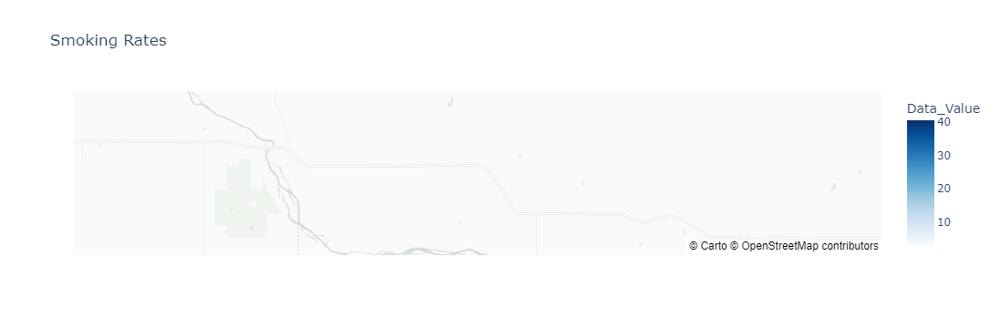

In [9]:
# Trends in Unhealthy Behaviors: Smoking rates 
import plotly.express as px
# Filter the dataset for smoking-related measures
smoking_data = sampled_data[sampled_data['Measure'].str.contains('Current smoking')]

# Create an interactive map using Plotly Express for smoking data
fig_smoking = px.scatter_mapbox(smoking_data,
                                lat="Latitude",
                                lon="Longitude",
                                color="Data_Value",
                                size="PopulationCount",
                                color_continuous_scale=px.colors.sequential.Blues,
                                size_max=15,
                                zoom=10,
                                mapbox_style="carto-positron",
                                title="Smoking Rates")

# To save the visualization as an HTML file
fig_smoking.show()
fig_smoking.write_html("smoking_rates_nyc.html")

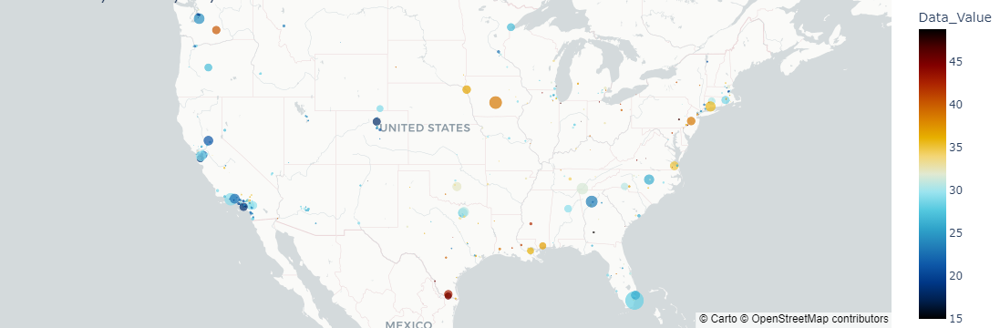

In [10]:
# Obesity Rates 

# We'll need to extract latitude and longitude from the GeoLocation column
sampled_data[['Latitude', 'Longitude']] = sampled_data['GeoLocation'].str.strip('()').str.split(', ', expand=True).astype(float)

# For demonstration, let's focus on Obesity rates as the health outcome
obesity_data = sampled_data[sampled_data['Short_Question_Text'] == 'Obesity']

# Assuming there might be multiple entries for a city, we calculate the average Obesity rate
obesity_avg = obesity_data.groupby('CityName').agg({'Latitude': 'first', 'Longitude': 'first',
                                                    'Data_Value': 'mean', 'PopulationCount': 'sum'}).reset_index()

# Creating the map
fig2 = px.scatter_mapbox(obesity_avg,
                        lat='Latitude',
                        lon='Longitude',
                        size='PopulationCount',
                        color='Data_Value',
                        hover_name='CityName',
                        hover_data=['Data_Value', 'PopulationCount'],
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max=15,
                        zoom=3,
                        mapbox_style='carto-positron')

fig2.update_layout(title='Obesity Rates by City',
                  geo=dict(scope='usa'),
                  margin={"r":0,"t":0,"l":0,"b":0})

fig2.show()
fig2.write_html("obesity_rates.html")

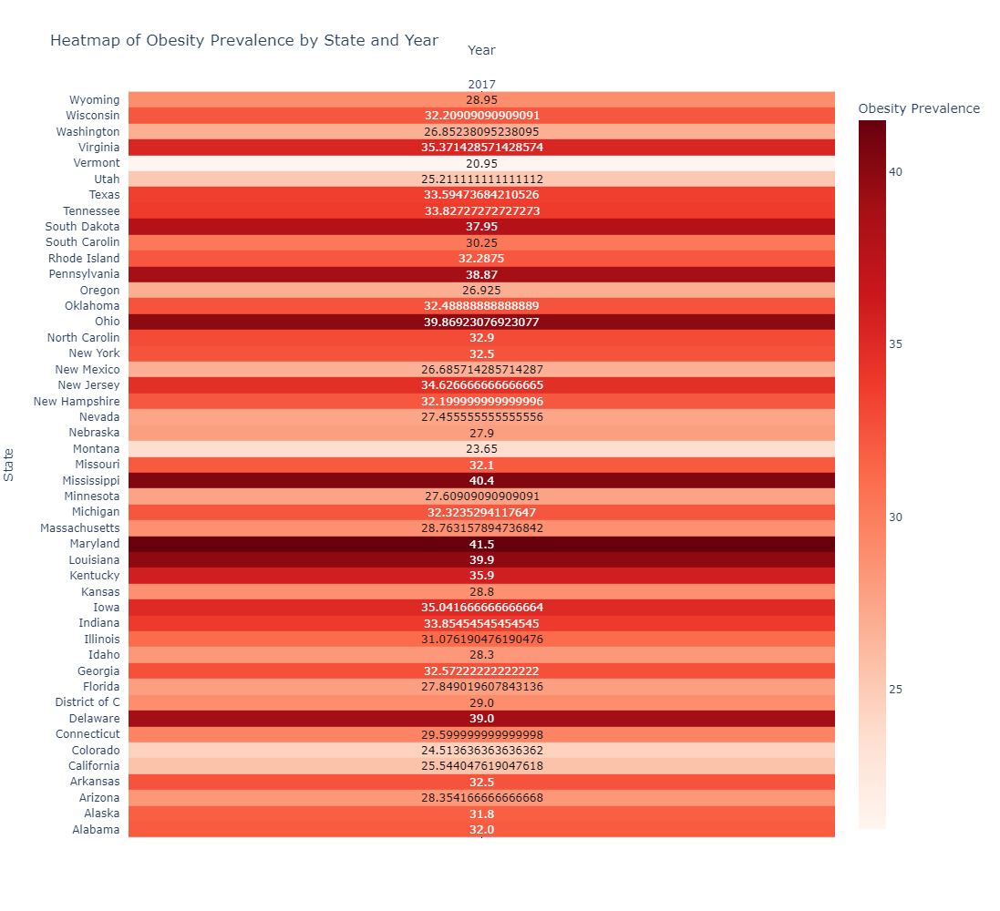

In [11]:
#  State-Wise Health Data Distribution of Obesity:

# Filter for a specific health metric, e.g., 'Obesity'
import plotly.figure_factory as ff

# Filter data for "Obesity" measure
obesity_data = sampled_data[sampled_data['Short_Question_Text'] == 'Obesity']

# Remove rows with missing Data_Value
obesity_data_clean = obesity_data.dropna(subset=['Data_Value'])

# Prepare the data for the heatmap
heatmap_data = obesity_data_clean.pivot_table(values='Data_Value', index='StateDesc', columns='Year')

# Create the heatmap
fig3 = ff.create_annotated_heatmap(
    z=heatmap_data.values,
    x=heatmap_data.columns.tolist(),
    y=heatmap_data.index.tolist(),
    colorscale='Reds',
    showscale=True,
    colorbar=dict(title='Obesity Prevalence')
)

# Update layout for the heatmap
fig3.update_layout(
    title='Heatmap of Obesity Prevalence by State and Year',
    xaxis_title='Year',
    yaxis_title='State',
    width=1100,  # Increase the width
    height=1000   # Increase the height
)
fig3.show()
fig3.write_html("statewise_distribution_obesity.html")

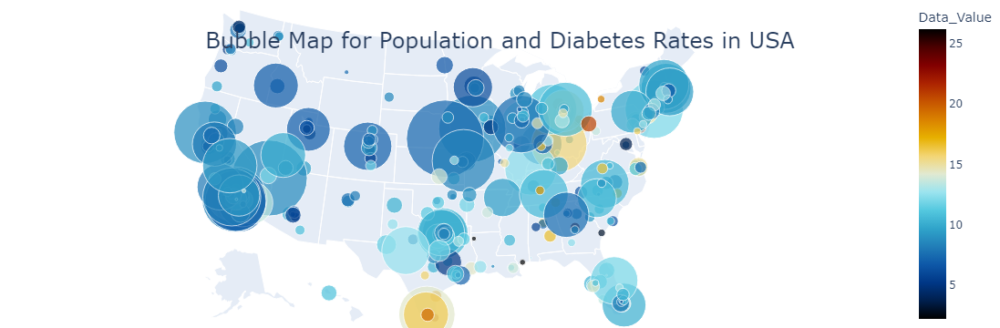

In [12]:
#  Population vs Diabetes Rates:

# Extract latitude and longitude from the 'GeoLocation' column
sampled_data[['Latitude', 'Longitude']] = sampled_data['GeoLocation'].str.strip('()').str.split(', ', expand=True).astype(float)

# Choose a health metric for the visualization, e.g., 'Diabetes'
health_metric = 'Diabetes'
diabetes_data = sampled_data[sampled_data['Short_Question_Text'] == health_metric]

# Calculate the average rate of diabetes and the total population for each city
city_diabetes_data = diabetes_data.groupby('CityName').agg({
    'Latitude': 'mean',
    'Longitude': 'mean',
    'Data_Value': 'mean',
    'PopulationCount': 'sum'
}).reset_index()

# Create a bubble map
fig4 = px.scatter_geo(city_diabetes_data,
                     lat='Latitude',
                     lon='Longitude',
                     size='PopulationCount',
                     color='Data_Value',
                     hover_name='CityName',
                     hover_data={'Data_Value': True, 'PopulationCount': True, 'Latitude': False, 'Longitude': False},
                     color_continuous_scale=px.colors.cyclical.IceFire,
                     size_max=60,
                     title='Bubble Map for Population and Diabetes Rates in USA')

# Update the layout
fig4.update_layout(
    geo=dict(scope='usa'),
    title={
        'text': 'Bubble Map for Population and Diabetes Rates in USA',
        'y': 0.9,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 24}
    },
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)

# Show the plot
fig4.show()
fig4.write_html("bubble_map.html")

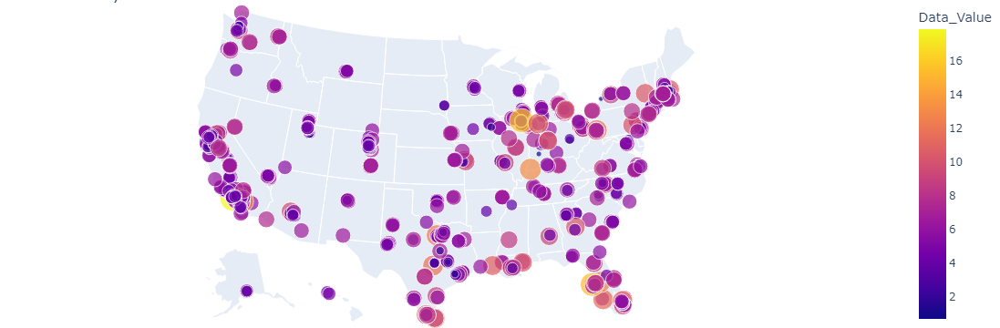

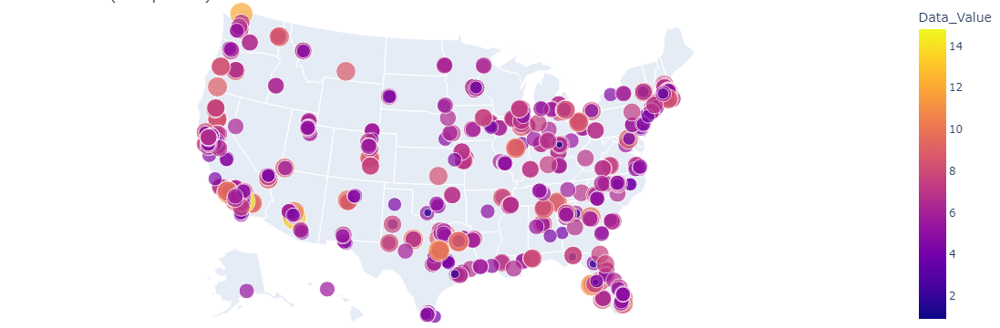

In [50]:
# Scattter Plots for Coronary Hart Disease and Cancer Prevalence in US Cities

# Function to create scatter plots for different health measures
def create_scatter_plot(measure):
    # Filter data for the specific measure
    measure_data = sampled_data[sampled_data['Short_Question_Text'] == measure]

    # Remove rows with missing Data_Value
    measure_data_clean = measure_data.dropna(subset=['Data_Value'])

    # Create the scatter plot
    fig = px.scatter_geo(measure_data_clean,
                         lat='Latitude',
                         lon='Longitude',
                         color='Data_Value',
                         hover_name='CityName',
                         size='Data_Value',
                         title=f'{measure} Prevalence in US Cities',
                         color_continuous_scale=px.colors.sequential.Plasma)

    fig.update_layout(title=f'{measure} Prevalence in US Cities',
                      geo=dict(scope='usa'),
                      margin={"r":0,"t":0,"l":0,"b":0})

    fig.write_html(f"scatter_plot_{measure.replace(' ', '_').replace('(', '').replace(')', '').lower()}.html")
    
    return fig

# List of measures to visualize
measures = ['Coronary Heart Disease', 'Cancer (except skin)']

# Create scatter plots for each measure and store them in variables
figs = {}
for measure in measures:
    figs[measure] = create_scatter_plot(measure)

# Access and use the figures later in the code
coronary_heart_disease_fig = figs['Coronary Heart Disease']
cancer_fig = figs['Cancer (except skin)']

# Show the figures
coronary_heart_disease_fig.show()
cancer_fig.show()


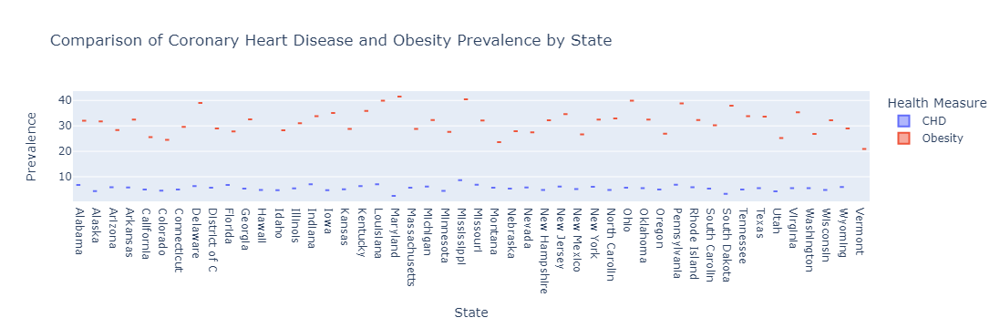

In [14]:
# Comparison of Coronary Heart Disease and Obesity Prevalence by state

cities_data = pd.read_csv('Cleaned_Sampled_Cities_Data_1.csv')

# Filter data for "Coronary Heart Disease" and "Obesity" measures
chd_data = cities_data[cities_data['Short_Question_Text'] == 'Coronary Heart Disease']
obesity_data = cities_data[cities_data['Short_Question_Text'] == 'Obesity']

# Remove rows with missing Data_Value
chd_data_clean = chd_data.dropna(subset=['Data_Value'])
obesity_data_clean = obesity_data.dropna(subset=['Data_Value'])

# Create a dictionary to map state abbreviations to state names
state_abbr_to_name = {row['StateAbbr']: row['StateDesc'] for _, row in cities_data.iterrows()}

# Add StateName column
chd_data_clean['StateName'] = chd_data_clean['StateAbbr'].map(state_abbr_to_name)
obesity_data_clean['StateName'] = obesity_data_clean['StateAbbr'].map(state_abbr_to_name)

# Aggregate data to get average CHD and Obesity prevalence by state and year
chd_state_yearly_data = chd_data_clean.groupby(['StateName', 'Year'])['Data_Value'].mean().reset_index()
obesity_state_yearly_data = obesity_data_clean.groupby(['StateName', 'Year'])['Data_Value'].mean().reset_index()

# Rename columns for clarity
chd_state_yearly_data.rename(columns={'Data_Value': 'CHD_Prevalence'}, inplace=True)
obesity_state_yearly_data.rename(columns={'Data_Value': 'Obesity_Prevalence'}, inplace=True)

# Label each dataset with the measure type
chd_state_yearly_data['Measure'] = 'CHD'
obesity_state_yearly_data['Measure'] = 'Obesity'

# Rename columns for melting
chd_state_yearly_data.rename(columns={'CHD_Prevalence': 'Prevalence'}, inplace=True)
obesity_state_yearly_data.rename(columns={'Obesity_Prevalence': 'Prevalence'}, inplace=True)

# Combine CHD and Obesity data for box plot comparison
combined_data_box = pd.concat([chd_state_yearly_data, obesity_state_yearly_data])

# Create the box plot
fig6 = px.box(combined_data_box,
             x='StateName',
             y='Prevalence',
             color='Measure',
             title='Comparison of Coronary Heart Disease and Obesity Prevalence by State',
             labels={'Prevalence': 'Prevalence', 'StateName': 'State', 'Measure': 'Health Measure'})
fig6.show()
fig6.write_html("chd_and_obesity.html")


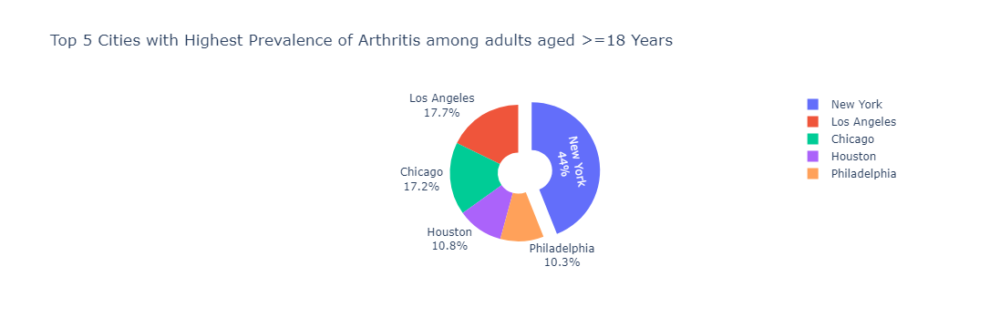

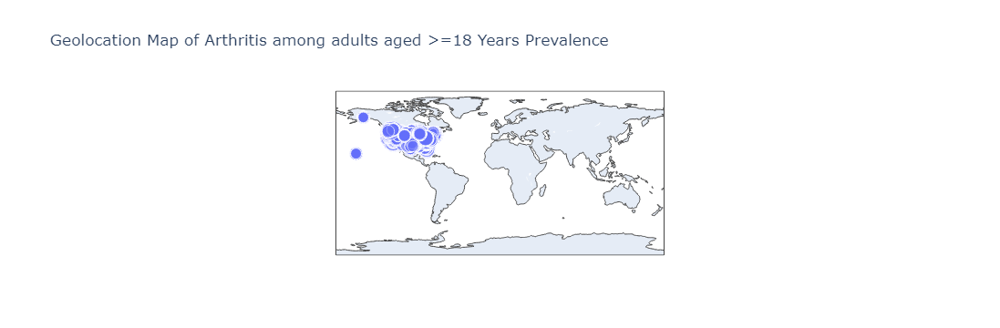

In [15]:
# Analysis of Top 5 cities with highest prevalence of Arthritis among adults aged >=18 Years

# Choosing a different measure
measure = 'Arthritis among adults aged >=18 Years'

# Filter the data for the chosen measure
measure_data = data[data['Measure'] == measure]

# Remove rows with NaN values in the 'Data_Value' column
measure_data = measure_data.dropna(subset=['Data_Value'])

# Group by city and sum the Data_Value to get total prevalence
city_measure_data = measure_data.groupby('CityName')['Data_Value'].sum().reset_index()

# Sort the cities by total prevalence and get the top 5
top_5_cities_measure = city_measure_data.nlargest(5, 'Data_Value')

# Create a pie chart for the top 5 cities
fig_pie = px.pie(
    top_5_cities_measure,
    names='CityName',
    values='Data_Value',
    title=f'Top 5 Cities with Highest Prevalence of {measure}',
    labels={'CityName': 'City', 'Data_Value': 'Prevalence (%)'},
    hole=0.3
)

# Highlight the city with the highest prevalence
biggest_city = top_5_cities_measure.iloc[0]['CityName']
fig_pie.update_traces(textinfo='label+percent', pull=[0.2 if city == biggest_city else 0 for city in top_5_cities_measure['CityName']])

# Show the pie chart
fig_pie.show()
fig_pie.write_html("pie_chart.html")

# Create a geolocation map for the chosen measure
fig_map = px.scatter_geo(
    measure_data,
    lat='Latitude',
    lon='Longitude',
    size='Data_Value',
    title=f'Geolocation Map of {measure} Prevalence',
    hover_name='CityName',
    hover_data={'Data_Value': True, 'Latitude': False, 'Longitude': False},
    size_max=15
)

# Show the interactive map
fig_map.show()
fig_map.write_html("interactive_map.html")

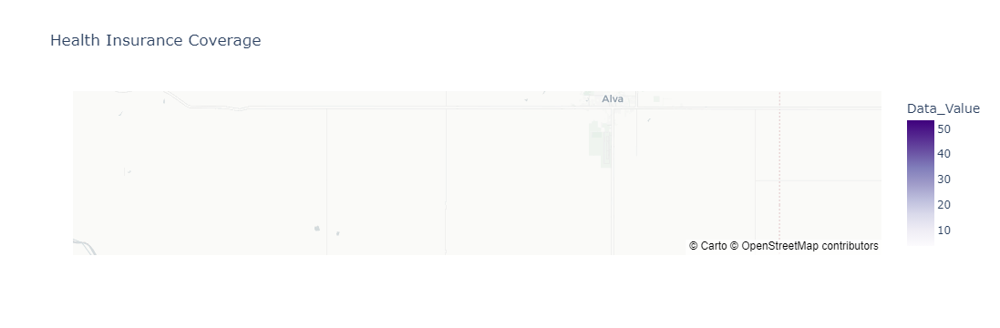

In [16]:
# Prevention Measures Analysis: Health Insurance Coverage

# Filter the dataset for health insurance coverage
insurance_data = sampled_data[sampled_data['Measure'].str.contains('health insurance')]

# Create an interactive map using Plotly Express for health insurance coverage data
fig_insurance = px.scatter_mapbox(insurance_data,
                                  lat="Latitude",
                                  lon="Longitude",
                                  color="Data_Value",
                                  size="PopulationCount",
                                  color_continuous_scale=px.colors.sequential.Purples,
                                  size_max=15,
                                  zoom=10,
                                  mapbox_style="carto-positron",
                                  title="Health Insurance Coverage")

fig_insurance.show()
fig_insurance.write_html("health_insurance.html")

In [17]:
# Core Preventive Services for older women by Top 10 States

# Filter data for "Core preventive services for older women" measure
preventive_services_data = cities_data[cities_data['Short_Question_Text'] == 'Core preventive services for older women']

# Remove rows with missing Data_Value
preventive_services_data_clean = preventive_services_data.dropna(subset=['Data_Value'])

# Create a dictionary to map state abbreviations to state names
state_abbr_to_name = {row['StateAbbr']: row['StateDesc'] for _, row in cities_data.iterrows()}

# Add StateName column
preventive_services_data_clean['StateName'] = preventive_services_data_clean['StateAbbr'].map(state_abbr_to_name)

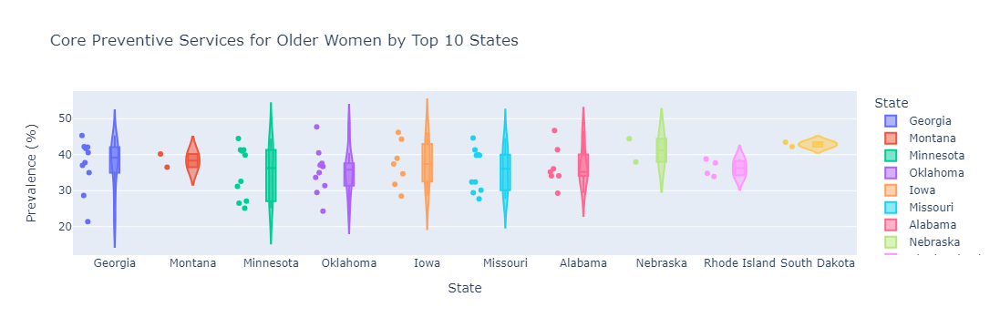

In [18]:
# Aggregate data to get average prevalence of core preventive services for older women by state
preventive_services_state_data = preventive_services_data_clean.groupby('StateName')['Data_Value'].mean().reset_index()

# Rename columns for clarity
preventive_services_state_data.rename(columns={'Data_Value': 'Prevalence'}, inplace=True)

# Select the top 10 states with the highest average prevalence
top_10_states = preventive_services_state_data.nlargest(10, 'Prevalence')['StateName']
top_10_data = preventive_services_data_clean[preventive_services_data_clean['StateName'].isin(top_10_states)]

# Create the violin plots for the top 10 states
fig9 = px.violin(top_10_data,
                x='StateName',
                y='Data_Value',
                color='StateName',
                box=True,
                points='all',
                title='Core Preventive Services for Older Women by Top 10 States',
                labels={'Data_Value': 'Prevalence (%)', 'StateName': 'State'})

# Display the violin plot
fig9.show()
fig9.write_html("core_preventive_services.html")

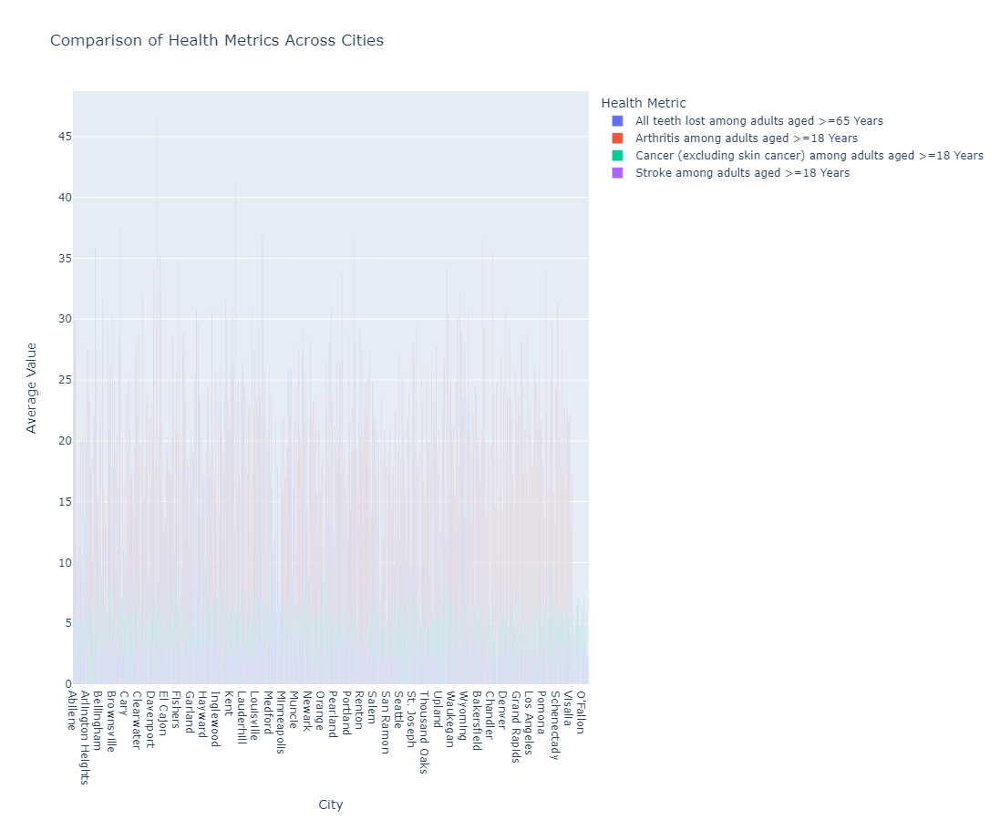

In [19]:
# Interactive bar chart comparing health metrics:

# Filter the dataset for selected health metrics
selected_metrics = [
    "Cancer (excluding skin cancer) among adults aged >=18 Years",
    "Arthritis among adults aged >=18 Years",
    "Stroke among adults aged >=18 Years",
    "All teeth lost among adults aged >=65 Years"
]

filtered_data = cities_data[cities_data['Measure'].isin(selected_metrics)]

# Group by city and measure, then calculate the average data value
grouped_data = filtered_data.groupby(['CityName', 'Measure'])['Data_Value'].mean().reset_index()

# Create the interactive bar chart
fig10 = px.bar(grouped_data, 
             x='CityName', 
             y='Data_Value', 
             color='Measure', 
             barmode='group',
             title='Comparison of Health Metrics Across Cities',
             labels={'Data_Value': 'Average Value', 'CityName': 'City', 'Measure': 'Health Metric'})

fig10.update_layout(width=1150,
                  height=900)

fig10.show()
fig10.write_html("health_metrics.html")

# Dashboard Website

In [54]:
# Website Generation

from bs4 import BeautifulSoup

# Step 1: Parse the HTML file
html_file_path = 'Project 3 - Group 6.html'
with open(html_file_path, 'r', encoding='utf-8') as file:
    soup = BeautifulSoup(file, 'html.parser')

# Extract data from the table
data = []
table = soup.find('table')
headers = [header.text.strip() for header in table.find_all('th')]

# Ensure all rows have the correct number of columns
for row in table.find_all('tr')[1:]:
    columns = row.find_all('td')
    if len(columns) == len(headers):
        data.append([column.text.strip() for column in columns])

# Save the visualizations as HTML divs
fig1_html = fig_smoking.to_html(full_html=False)
fig2_html = fig2.to_html(full_html=False)
fig3_html = fig3.to_html(full_html=False)
fig4_html = fig4.to_html(full_html=False)
coronary_heart_disease_fig_html = coronary_heart_disease_fig.to_html(full_html=False)
cancer_fig_html = cancer_fig.to_html(full_html=False)
fig6_html = fig6.to_html(full_html=False)
fig_pie_html = fig_pie.to_html(full_html=False)
fig_map_html = fig_map.to_html(full_html=False)
fig_insurance_html = fig_insurance.to_html(full_html=False)
fig9_html = fig9.to_html(full_html=False)
fig10_html = fig10.to_html(full_html=False)

In [62]:
# Step 3: Generate a New HTML Page with enhanced UI
html_content = f"""
<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Analysis of Health Profiles Across the USA - Dashboard</title>
    <link rel="stylesheet" href="https://stackpath.bootstrapcdn.com/bootstrap/4.5.2/css/bootstrap.min.css">
    <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
    <style>
        body {{
            font-family: Arial, sans-serif;
            background-color: #f8f9fa;
            margin: 0;
            padding: 0;
        }}
        .navbar {{
            background-color: #5188C7;
        }}
        .navbar-brand, .nav-link {{
            color: #ffffff !important;
        }}
        .nav-link {{
            font-size: 14px;
        }}
        .container {{
            margin-top: 20px;
        }}
        .section {{
            margin-bottom: 40px;
        }}
        .section h3 {{
            color: #343a40;
            margin-bottom: 20px;
            font-size: 18px;
        }}
        .card {{
            padding: 20px;
            border-radius: 10px;
            background-color: #ffffff;
            box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);
        }}
    </style>
</head>
<body>
    <nav class="navbar navbar-expand-lg">
        <a class="navbar-brand" href="#">Analysis of Health Profiles Across the USA - Dashboard</a>
        <div class="collapse navbar-collapse">
            <ul class="navbar-nav mr-auto">
                <li class="nav-item">
                    <a class="nav-link" href="#section1">Scatter Plot</a>
                </li>
                <li class="nav-item">
                    <a class="nav-link" href="#section2">HeatMap</a>
                </li>
                <li class="nav-item">
                    <a class="nav-link" href="#section3">Bubble Plot</a>
                </li>
                <li class="nav-item">
                    <a class="nav-link" href="#section4">Line Plot</a>
                </li>
                <li class="nav-item">
                    <a class="nav-link" href="#section5">Pie Chart</a>
                </li>
                <li class="nav-item">
                    <a class="nav-link" href="#section5">Geoloaction Map</a>
                </li>
                 <li class="nav-item">
                    <a class="nav-link" href="#section6">Scatter Plots 2</a>
                </li>
                <li class="nav-item">
                    <a class="nav-link" href="#section7">Scatter Map-plot</a>
                </li>
                <li class="nav-item">
                    <a class="nav-link" href="#section8">Violin Map</a>
                </li>
                <li class="nav-item">
                    <a class="nav-link" href="#section9">Stacked Bar Charts</a>
                </li>
            </ul>
        </div>
    </nav>
    <div class="container">
        <div id="section1" class="section">
            <h3>Trends in Unhealthy Behaviors: Smoking rates and Obesity rates</h3>
            <div class="card">
                {fig1_html}
                {fig2_html}
            </div>
        </div>
        <div id="section2" class="section">
            <h3>State-Wise Health Data Distribution of Obesity</h3>
            <div class="card">
                {fig3_html}
            </div>
        </div>
        <div id="section3" class="section">
            <h3>Population vs Diabetes Rates</h3>
            <div class="card">
                {fig4_html}
            </div>
        </div>
        <div id="section6" class="section">
            <h3>Scattter Plots for Coronary Hart Disease and Cancer Prevalence in US Cities</h3>
            <div class="card">
                {coronary_heart_disease_fig_html}
                {cancer_fig_html}
            </div>
        </div>
        <div id="section4" class="section">
            <h3>Comparison of Coronary Heart Disease and Obesity Prevalence by state</h3>
            <div class="card">
                {fig6_html}
            </div>
        </div>
        <div id="section5" class="section">
            <h3>Analysis of Top 5 cities with highest prevalence of Arthritis among adults aged >=18 Years</h3>
            <div class="card">
                {fig_pie_html}
                {fig_map_html}
            </div>
        </div>
        <div id="section7" class="section">
            <h3>Prevention Measures Analysis: Health Insurance Coverage</h3>
            <div class="card">
                {fig_insurance_html}
            </div>
        </div>
        <div id="section8" class="section">
            <h3>Core Preventive Services for older women by Top 10 States</h3>
            <div class="card">
                {fig9_html}
            </div>
        </div>
        <div id="section9" class="section">
            <h3>Interactive bar chart comparing health metrics</h3>
            <div class="card">
                {fig10_html}
            </div>
        </div>
        <div id="section9" class="section">
            <h3>Thank you, Group 6 signing off - </h3>
            <div class="card"> 
                <ol>
                <li> Snehal Yadav </li>
                <li> Sanjana Rao </li>
                <li> Atharv Nirhali </li>
                <li> Shreya Ale </li>
                </ol>    
            </div>
        </div>
    </div>
</body>
</html>
"""

In [64]:
# Write the HTML content to a new file
output_html_file_path = 'Project 3 Dashboard - Group 6.html'
with open(output_html_file_path, 'w', encoding='utf-8') as file:
    file.write(html_content)

print(f"Dashboard generated: {output_html_file_path}")

Dashboard generated: Project 3 Dashboard - Group 6.html
